# Circular Statistics--Parasteatoda

## Packages

In [1]:
#Import relevant packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import csv
import math
from datetime import datetime
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.tsa.stattools import acf
from scipy import stats
from matplotlib.gridspec import GridSpec

## Module

In [21]:
class Circular:
    
    def __init__(self, period=24., nbins=36):
        self.period=period
        self.nbins=nbins
        self.binwidth = self.period/self.nbins
        self.binwidth_radians = 2. * np.pi/self.nbins
        self.binwidth_degrees =       360./self.nbins
        
    #----------------------------------
    #    Convert degrees to radians
    #----------------------------------
    def Degrees_to_Radians(self, degree):
        return degree/180.*np.pi

    #----------------------------------
    #    Convert radians to degrees
    #----------------------------------
    def Radians_to_Degree(self, radians):
        return radians/np.pi*180.

    #----------------------------------
    #    Convert hours to minutes
    #----------------------------------
    def to_min(self, hours):
        return(hours*60.)

    #----------------------------------
    # Label the axis according to the period
    #----------------------------------
    def axis_labels(self, nbins):
        degrees_list = np.linspace(0, 360, nbins+1)
        hours_list   = np.linspace(0, self.period, nbins+1)
        hours_pretty = hours_list.round(1)
        # Do not return last label to avoid double-labeling zero poing
        return(degrees_list, hours_pretty[:-1]) 

    #----------------------------------
    # Find the maximum position of the autocorrelation data
    #----------------------------------
    def max_position(self, data):
        threshold=600
        maxp=0
        maxv=0
        i=0
        for d in data[threshold:]:
            if d>maxv:
                maxv=d
                maxp=i+threshold
            i=i+1
        return maxp, maxv

    #----------------------------------
    # Load the spider data
    #----------------------------------
    def load_data(self, filename):
        #Read in the data
        self.df_full = pd.read_csv(filename, index_col=0)
        self.df_full.index = pd.to_datetime(self.df_full.index)

    #----------------------------------
    # Get the period of the spider according to the autocorrelation
    #----------------------------------
    def get_period_by_acf(self, spider_col):
        hours=36
        lag=self.to_min(hours)
        ACF_data=acf(self.df_full[spider_col], nlags=lag, fft=False)
        maxp, maxv=self.max_position(ACF_data)
        self.period=maxp/60
    
    #----------------------------------
    # Resample the data according to the number of bins defined
    #----------------------------------
    def groupby_bins(self, spider):
        period_min=int(self.to_min(self.period))
        efflen=len(self.df_full)//period_min*period_min
        df = self.df_full[0:efflen].copy()
        # Add column which contains bin number(phase)
        df['bin_number']= np.arange(0, len(df))*self.nbins//period_min%self.nbins
        self.df_bins = df.groupby('bin_number').sum()
        self.df_bins[spider]=self.df_bins[spider]/np.sum(self.df_bins[spider])
        
    #----------------------------------
    # Calculate the mean direction of the spider
    #----------------------------------
    def mean_direction(self, spider_col):
        self.df_bins['x'] = np.cos(self.df_bins.index*self.binwidth_radians)
        self.df_bins['y'] = np.sin(self.df_bins.index*self.binwidth_radians)
        x_total = np.sum(self.df_bins.x*self.df_bins[spider_col])
        y_total = np.sum(self.df_bins.y*self.df_bins[spider_col])
        self.r_total = np.sqrt(x_total**2 + y_total**2)
        x_avg = x_total/self.r_total
        y_avg = y_total/self.r_total
        #theta: mean direction
        #change radian to degree
        if x_total<0:
            if y_total>0:
                self.theta_avg = self.Radians_to_Degree(np.arctan(y_avg/x_avg)+np.pi)
            else:
                self.theta_avg = self.Radians_to_Degree(np.arctan(y_avg/x_avg)-np.pi)
        else:
            self.theta_avg = self.Radians_to_Degree(np.arctan(y_avg/x_avg))

    #----------------------------------
    # Plot raster plot for the spider in left panel
    #----------------------------------
    def plot_raster(self, Spider, gs):
        one_day=60*24

        #The number of days included in the RasterData
        number_of_days=int(len(self.df_full)/one_day)

        #Loop through days and plot daily activity as a subplot 
        for i in range(0,number_of_days):

            #Separate the RasterData in the length of one day
            data=pd.DataFrame(self.df_full.iloc[0+i*one_day:one_day+i*one_day])

            #Share the subplots in the left panel with the same x-axis 
            if i==0:
                ax1=plt.subplot(gs[i,0])
                ax0=ax1
            else:
                ax1=plt.subplot(gs[i,0],sharex=ax0)
            if i<number_of_days-1:
                plt.setp(ax1.get_xticklabels(), visible=False)

            #Plot the raster plot
            ax1.plot(data.Time,data[Spider])

            #Set the date as y-axis labe
            #ax1.set_ylabel(data.Date[1])
            ax1.set_ylabel(i+1, fontsize=14)

            #Indicate the dark portion of the day by gray shading
            light=True
            for t in data.index:
                if data.lights[t]==0:
                    if light:
                        light=False
                        start=t
                else:
                    if not light:
                        light=True
                        ax1.axvspan(data.Time[start],data.Time[t], alpha=0.3, color='gray')
            if not light:
                ax1.axvspan(data.Time[start],data.Time[t], alpha=0.3, color='gray')

        #The number of ticks in x-axis and the length between each point
        number_of_points=6
        len_between_points=24*60/number_of_points

        #Define the range of the x-axis and change the number of ticks on x-axis
        plt.xticks(range(0,int(one_day)+1,int(len_between_points)), range(0,int(one_day/60)+1,int(len_between_points/60)), fontsize=14)
        plt.xlim(0,one_day)
        
        plt.tight_layout()
        
    #----------------------------------
    # Plot circular plot for the spider in right panel
    #----------------------------------
    def plot_circular(self, spider_col, ax):
        #Color of the bars
        radii = 10 * np.random.rand(self.nbins)
        colors = plt.cm.viridis(radii/10.)
        #Get the angle in radians(*theta*) for all bins
        theta = self.df_bins.index*self.binwidth_radians
        #Plot the bar plot with polar coordinate
        ax.bar(theta, self.df_bins[spider_col], width=self.binwidth_radians, bottom=0.0, color=colors, alpha=0.5)
        #Plot the mean direction normalized by a number of bins
        ax.plot([0,self.Degrees_to_Radians(self.theta_avg)], [0,self.r_total/self.nbins], color='red',linewidth=3)
        #Add gray shading to the dark period in LD
        """ax.axvspan(np.pi/3.00, np.pi*2/3.0,ymax=1.2, alpha=0.3, color='gray')
        ax.axvspan(0, np.pi/3.0,ymax=1.2, alpha=0.3, color='gray')
        ax.axvspan(np.pi*5/3.0, np.pi*2,ymax=1.2, alpha=0.3, color='gray')"""
        #Add gray shading to DD period
        #ax.axvspan(-np.pi, np.pi,ymax=1.2, alpha=0.3, color='gray')
        
        #Re-label the axis with hours instead of degrees using *nlabels* labeling points
        nlabels = 8
        [deg, hours] = self.axis_labels(nlabels)
        ax.set_thetagrids(deg, hours, fontsize=15)
        ax.set_title(spider_col, fontsize=17)
        #plt.yticks([0.02, 0.04, 0.06, 0.08])
        
        #Set the range of the radius of circular plot (Modify according to the range of each spider's circular plot)
        #ax.set_rlim(0,0.12)
        plt.show()
        
    #----------------------------------
    # Run the process
    #----------------------------------        
    def run(self, filename, spider_col, p):
        self.load_data(filename)
        #Calculate the circadian period by autocorrelation for DD period
        #self.get_period_by_acf(spider_col)
        self.period=p
        self.groupby_bins(spider_col)
        self.mean_direction(spider_col)
        
    def run_plot(self, spider):
        fig = plt.figure(figsize=(17, 8))
        gs=GridSpec(9, 2, figure=fig)
        self.plot_raster(spider, gs)
        ax = plt.subplot(gs[0:-1,1], projection='polar')
        self.plot_circular(spider, ax)

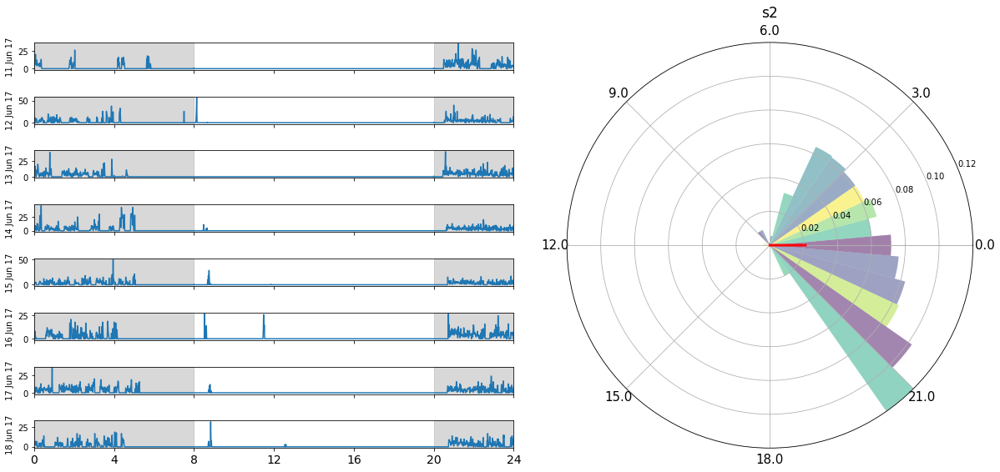

In [13]:
obj=Circular(nbins=36)
#obj.run('Para_DD.csv', 's2', 21.701522)
obj.run('Para_LD.csv', 's2', 24.)
obj.run_plot('s2')

## Test the best bin number

We want to find the most suitable bin number for the circular plot so we test 18, 36, and 54 bins with three different spiders.

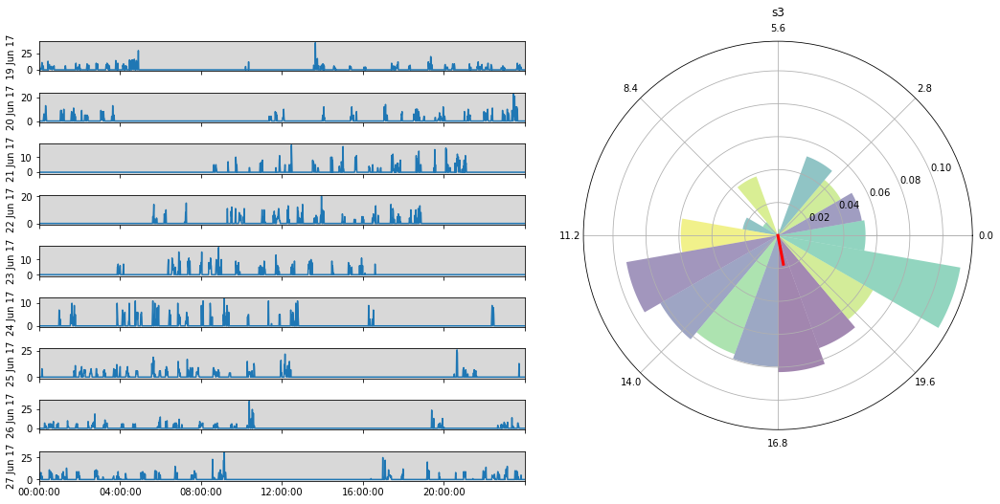

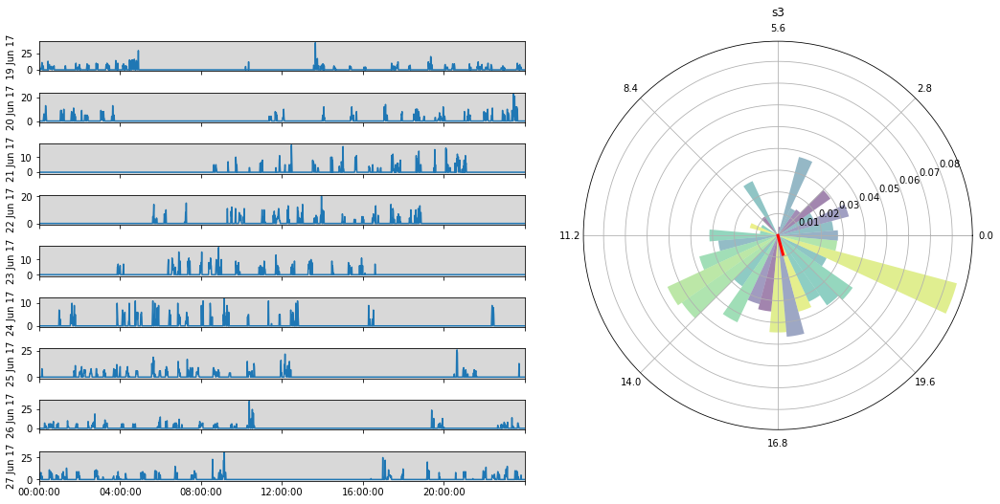

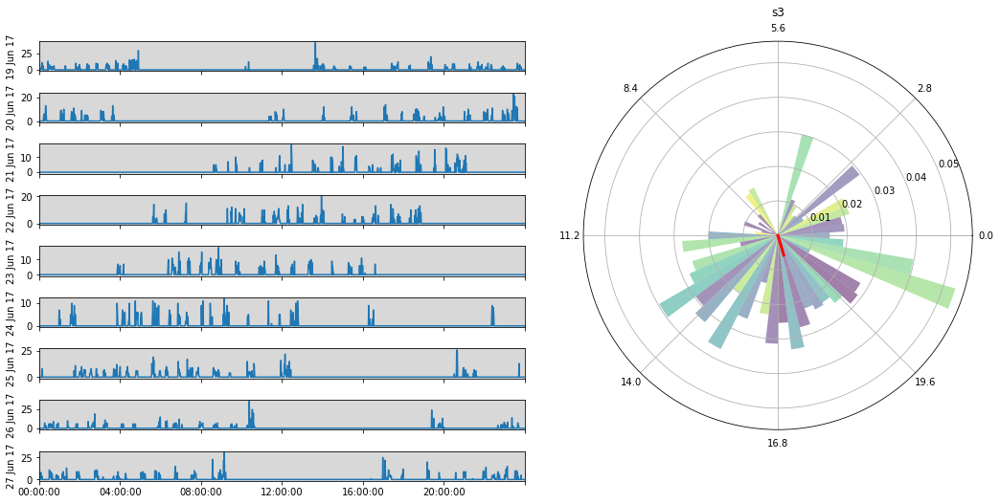

In [141]:
for i in [18, 36, 54]:
    obj=Circular(nbins=i)
    obj.run('Para_DD.csv', 's3')
    obj.run_plot('s3')

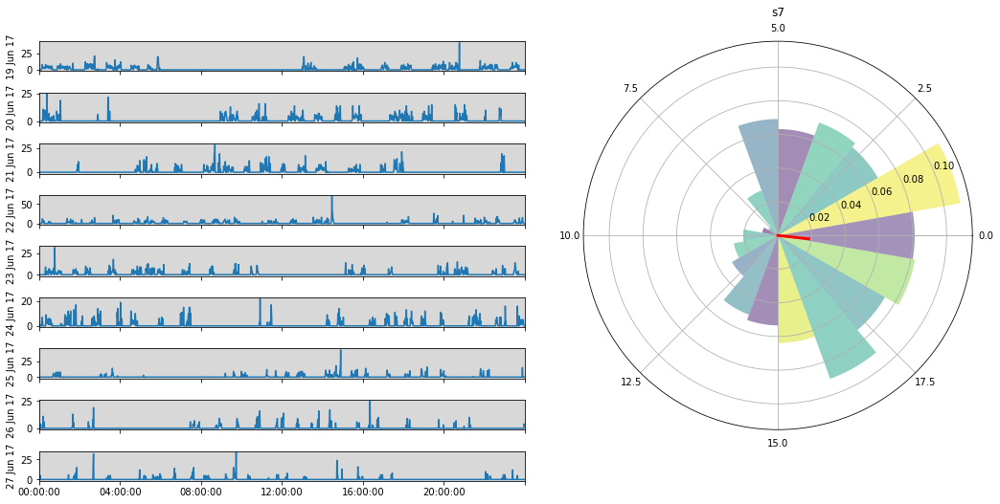

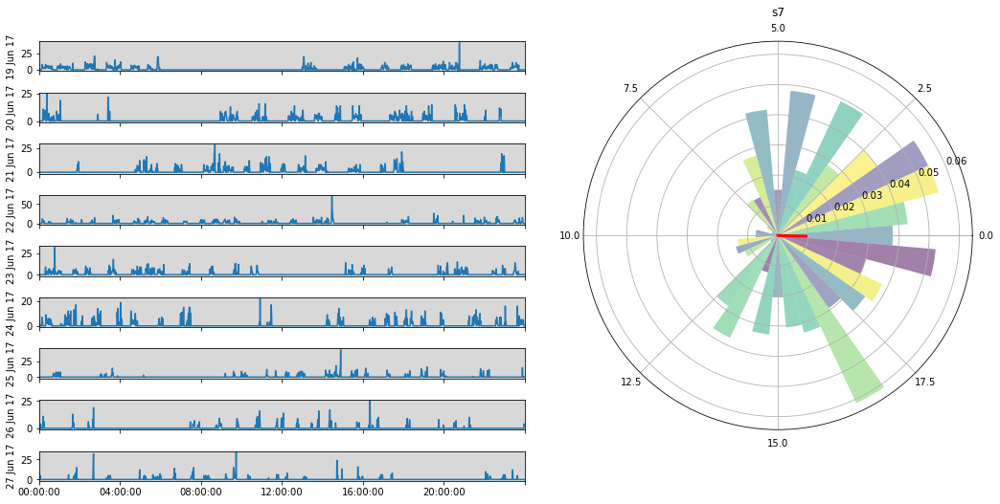

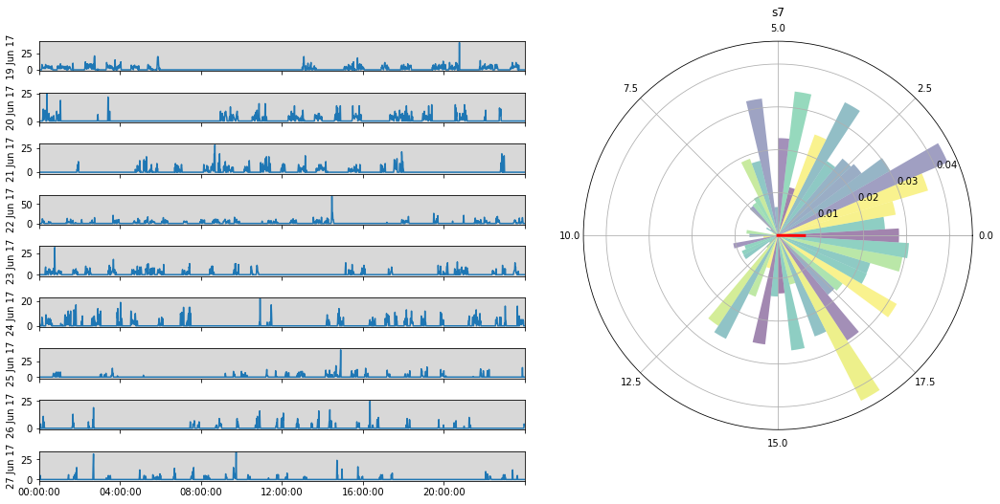

In [142]:
for i in [18, 36, 54]:
    obj=Circular(nbins=i)
    obj.run('Para_DD.csv', 's7')
    obj.run_plot('s7')

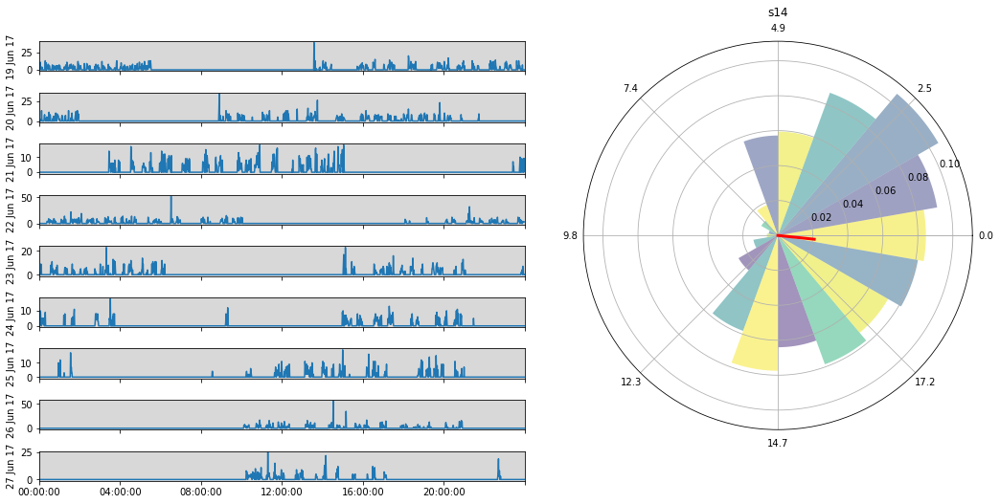

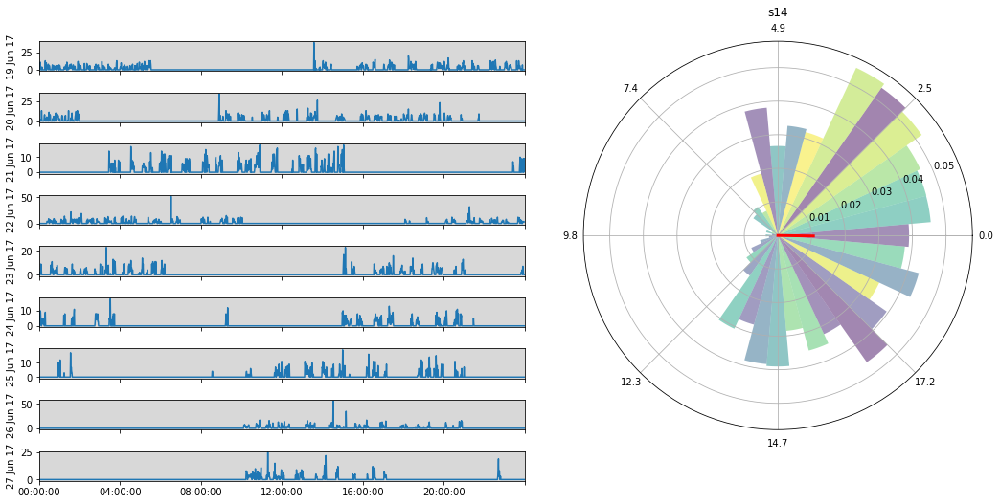

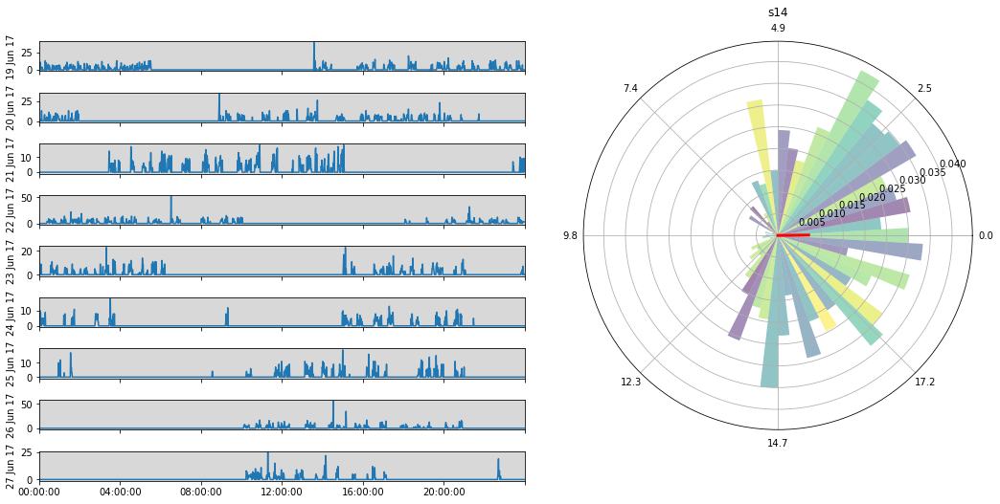

In [143]:
for i in [18, 36, 54]:
    obj=Circular(nbins=i)
    obj.run('Para_DD.csv', 's14')
    obj.run_plot('s14')

We choose 36 as our bin number so that the width of each bin is 10 degrees which makes it easier to understand. When there are 54 bins, the bin width is too small to see the pattern and too big for 18 bins.

## Test all rhythmic spiders

In [16]:
#Dataframe indicating whether the spider is rhythmic in LD and DD period. Rhythmic if 1, 0 otherwise.
df_rhythm=pd.read_csv('Rhythm.csv', index_col=0)
df_rhythm.head()

,LD,DD
s1,1,0
s2,1,1
s3,1,1
s4,1,1
s5,0,0


In [19]:
#Dataframe containing DD period calculated by periodogram and corresponding p-value
df_period=pd.read_csv('Para_DD_Stats.csv', index_col=0)
df_period.head()

,Period,Amplitude,p value
Spider,,,
s1,21.833147,95.500000,1.085111e-36
s2,21.701522,3393.873060,0.000000e+00
s3,21.485639,943.961688,0.000000e+00
s4,22.422469,285.728843,4.551056e-119
s5,20.623953,8.212159,1.000000e+00


In [17]:
s=['s1','s2','s3','s4','s5','s6','s7','s8','s9','s10','s11','s13','s14','s15','s16','s17','s18','s19','s20','s21','s22','s23','s24','s27','s29','s30','s31','s32']

## LD Period

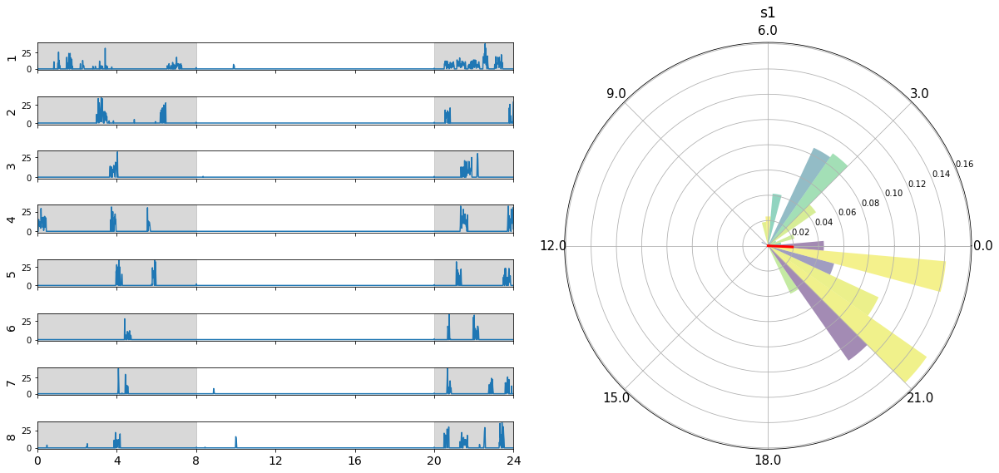

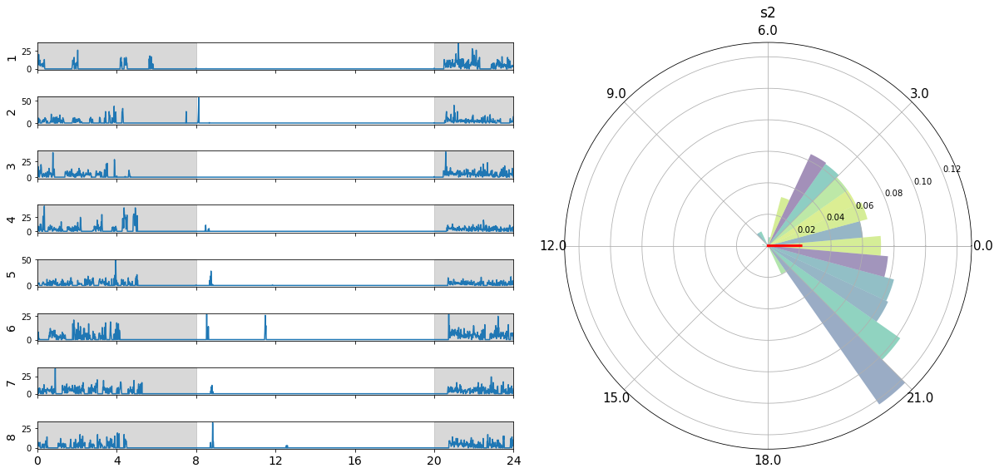

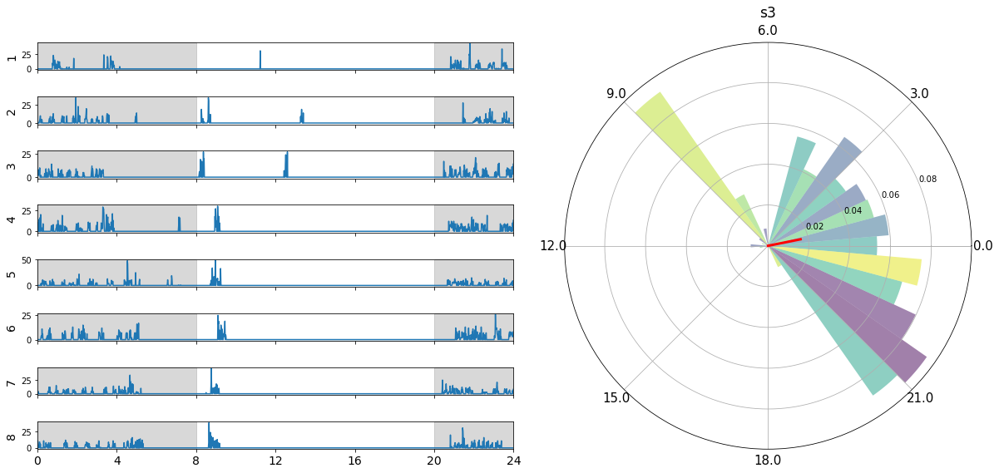

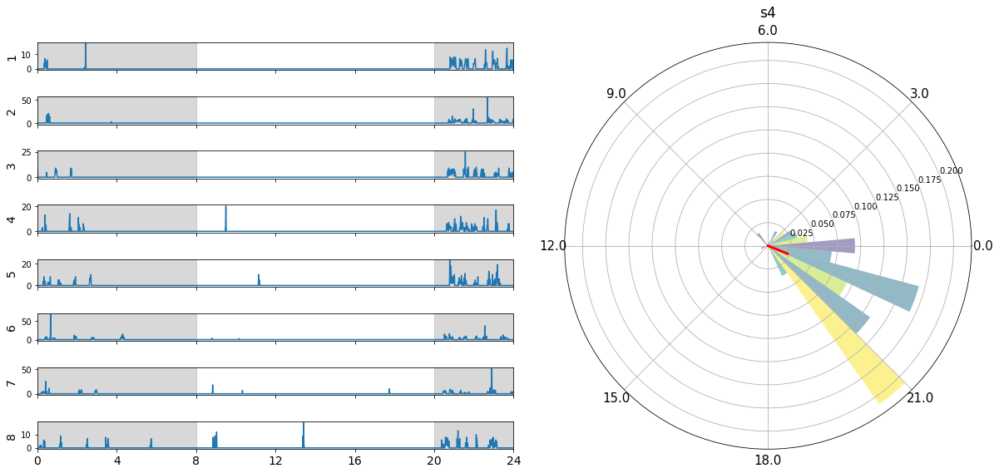

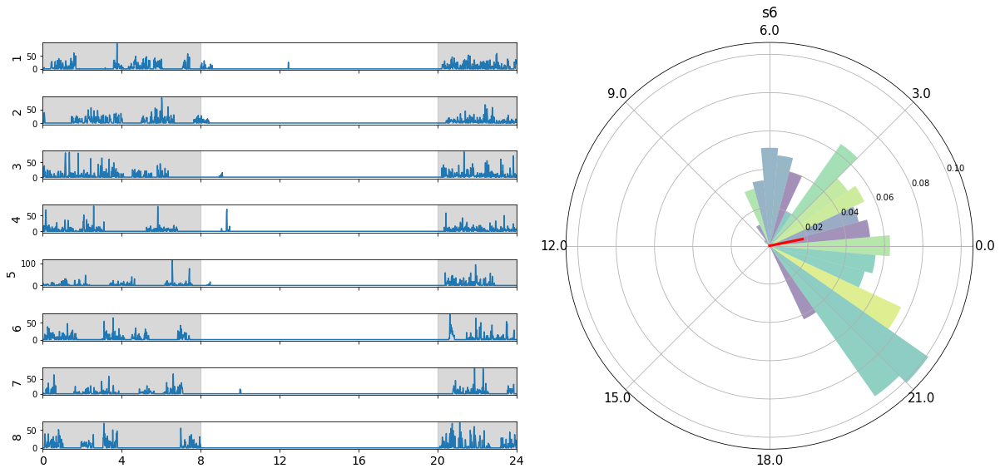

...

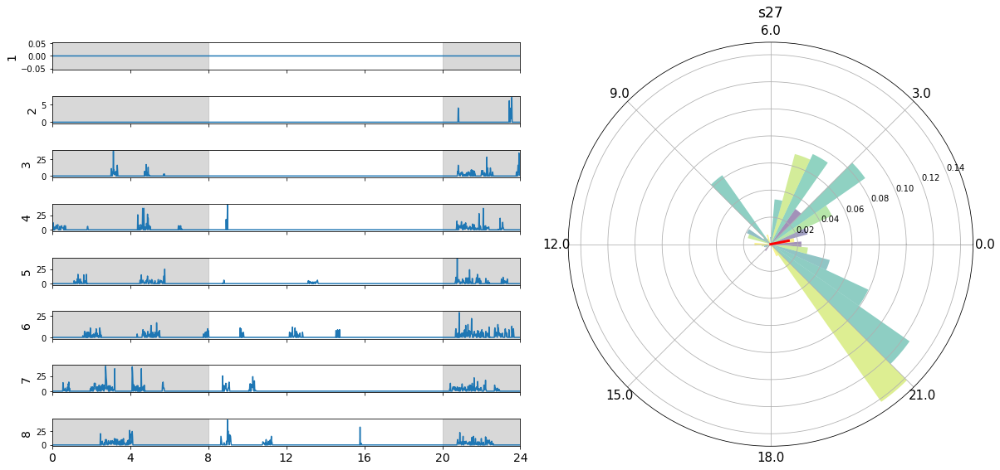

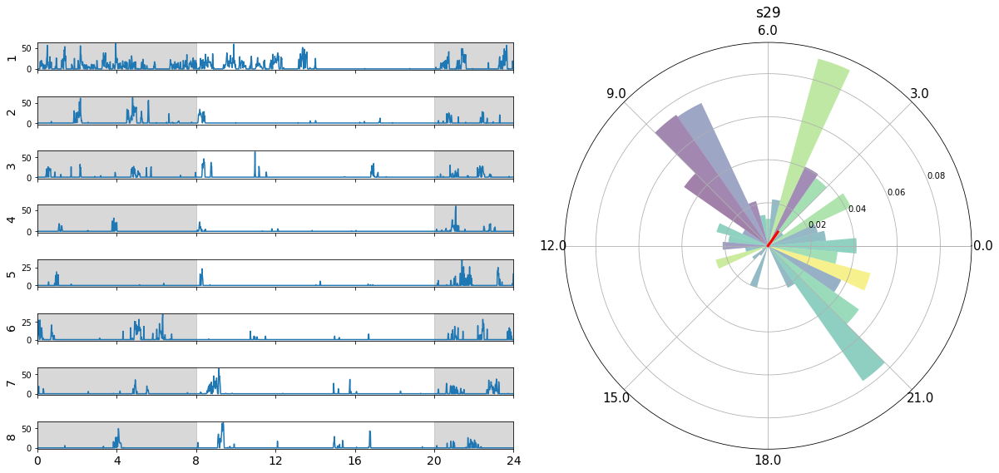

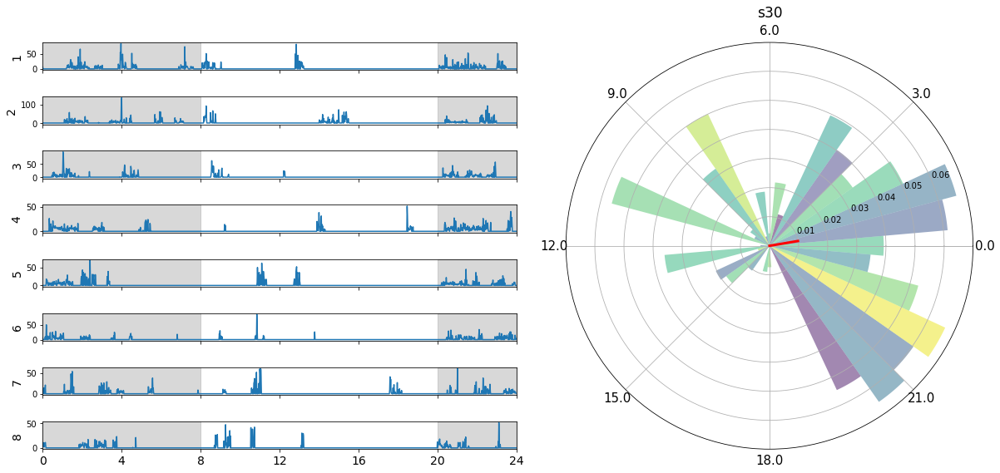

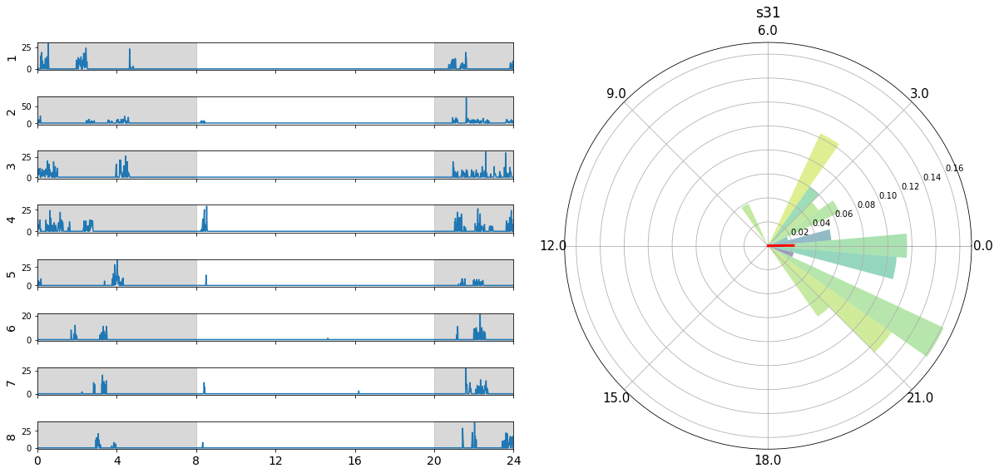

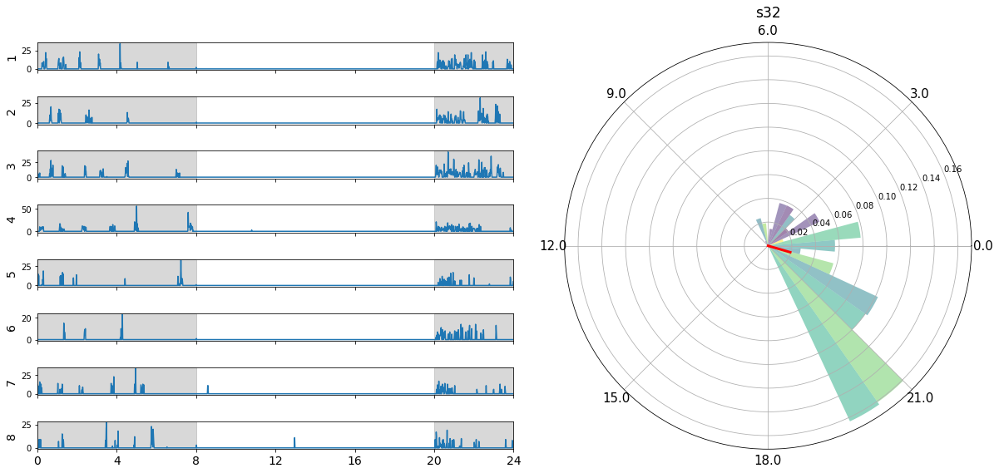

In [22]:
#md_ld: mean direction of each spider in LD period
#r_ld: r value of each spider in LD period
md_ld=[]
r_ld=[]
for spider in s:
    #Only use spiders whose DD period calculated by periodogram is statistically significant at the level of 0.001
     if df_period.loc[spider, 'p value']<=0.001:
        period=df_period.loc[spider, 'Period']
        obj=Circular(nbins=36)
        #For LD, the period is assumed to be 24h which is the length of a normal day
        obj.run('Para_LD.csv', spider, 24.)
        obj.run_plot(spider)
        #Save the mean direction and r value in the lists
        md_ld.append(obj.theta_avg)
        r_ld.append(obj.r_total)

### Generate summary plots

Mean direction in LD period [-2.790347289117989, 0.06464286185484994, 11.349970900861951, -22.211836204488314, 11.485014211041031, -10.521874239497883, -10.896601704816735, 1.2553412319581894, -11.802829452921493, -38.78862696961002, -2.412824507280753, 2.159652755620111, 16.092082575024435, 11.041983318586931, 2.345327184930275, 37.60785726978399, 30.105129146784932, -22.008309911067926, 1.474284576800919, 5.215820651944691, -9.417144462382277, 10.996321841510262, 54.67044137765472, 9.530775217184598, 0.713272930147222, -16.211162394275654]
R value in LD period [0.6970017582348159, 0.7550343606473188, 0.5843675155015359, 0.8153432263623113, 0.6317360433934154, 0.8274556943894266, 0.7139128129458034, 0.268833903956239, 0.7058649643737356, 0.8637199214089084, 0.8033407487527651, 0.730764579086071, 0.47011220370310747, 0.6745907925095767, 0.282690677752724, 0.4987094746542268, 0.054569864240271736, 0.27773616225158104, 0.5470495587571491, 0.6537321984747814, 0.7904508264000766, 0.4844683

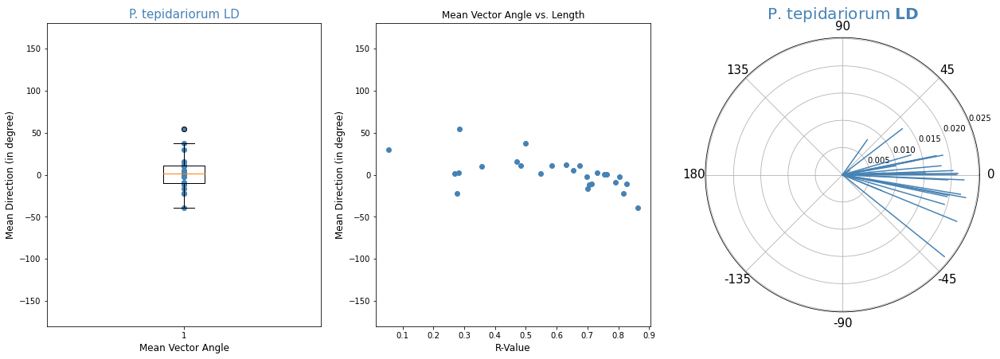

In [23]:
print('Mean direction in LD period', md_ld)
print('R value in LD period', r_ld)

x=np.ones(len(md_ld))
theta_radius_ld=[x*np.pi/180 for x in md_ld]
r_norm_ld=[x/36 for x in r_ld]

plt.figure(figsize=(21, 7))

#Boxplot
plt.subplot(131)
plt.boxplot(md_ld)
plt.title('P. tepidariorum LD', fontsize=15, c='steelblue')
plt.scatter(x, md_ld, c='steelblue')
plt.ylim(-180, 180)
plt.ylabel('Mean Direction (in degree)', fontsize=12)
plt.xlabel('Mean Vector Angle', fontsize=12)

#Scatter plot
plt.subplot(132)
plt.title('Mean Vector Angle vs. Length')
plt.scatter(r_ld, md_ld, c='steelblue')
plt.ylim(-180, 180)
plt.ylabel('Mean Direction (in degree)', fontsize=12)
plt.xlabel('R-Value', fontsize=12)

#Circular plot for all spiders
ax=plt.subplot(133, projection='polar')
ax.set_xticks([0,np.pi/4, np.pi/2, 3*np.pi/4, np.pi, 5*np.pi/4, 3*np.pi/2, 7*np.pi/4])
ax.set_xticklabels([0,45,90,135,180,-135,-90,-45], fontsize=15)
plt.title('P. tepidariorum '+r"$\bf{" +'LD' + "}$", fontsize=20, c='steelblue')
for i in range(0, len(theta_radius_ld)):
    plt.plot([0, theta_radius_ld[i]], [0, r_norm_ld[i]], 'steelblue')
plt.yticks([0.005, 0.010, 0.015, 0.020, 0.025])

#Save the figure
#plt.savefig('Parasteatoda tepidariorum LD')
plt.show()

In [13]:
#Save the mean direction and r value (mean length) in a dataframe
para_ld=pd.DataFrame({'Mean Direction': md_ld, 'Mean Length': r_ld}, index=df_rhythm[(df_rhythm['LD']==1) & (df_rhythm['DD']==1)].index)
#Save as a .csv file
para_ld.to_csv('Mean_Para_LD.csv')
para_ld.head()

,Mean Direction,Mean Length
s2,0.064643,0.755034
s3,11.349971,0.584368
s4,-22.211836,0.815343
s7,-10.521874,0.827456
s8,-10.896602,0.713913


In [272]:
#Calculate the correlation between mean direction and r value (mean length)
ld=pd.DataFrame({'Mean Direction': md_ld, 'Mean Length': r_ld})
ld.corr()

,Mean Direction,Mean Length
Mean Direction,1.000000,-0.789629
Mean Length,-0.789629,1.000000


Negative correlation between mean direction and mean length.

## DD Period

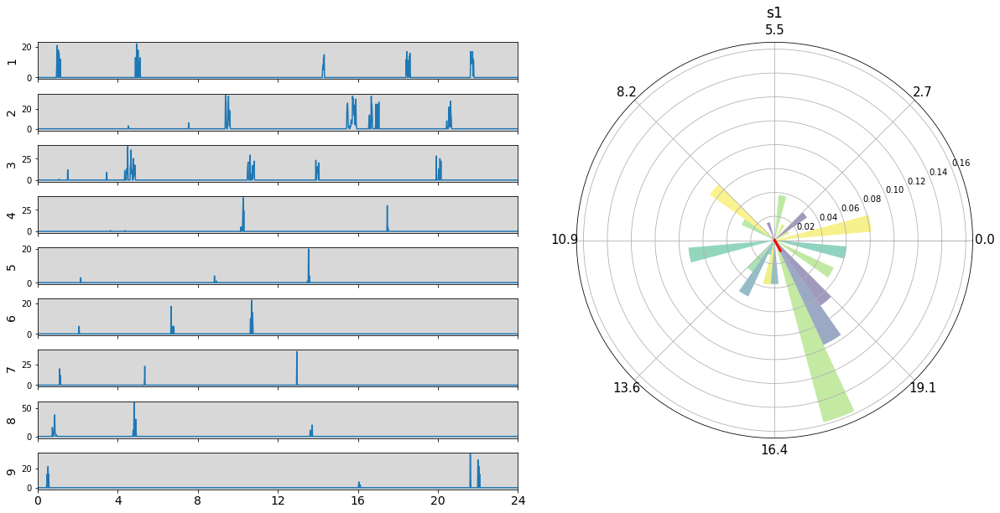

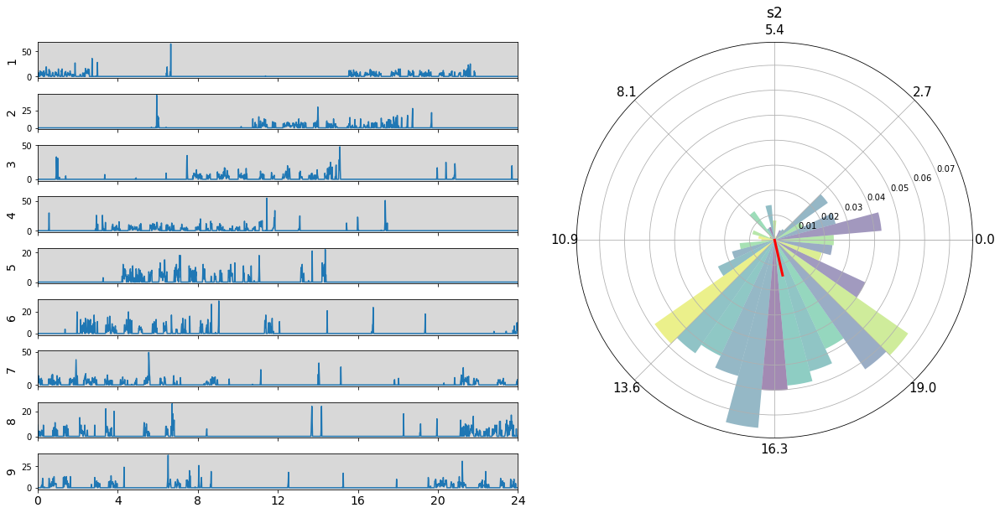

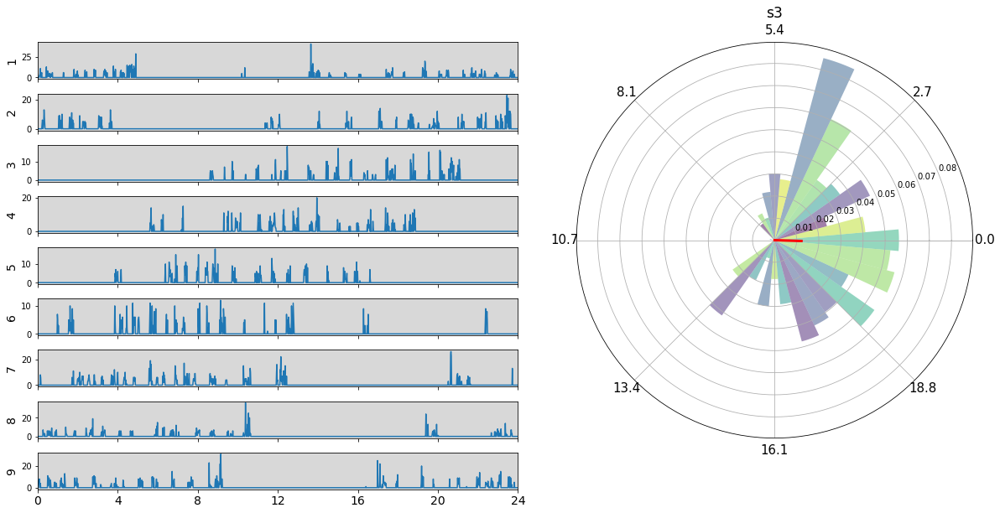

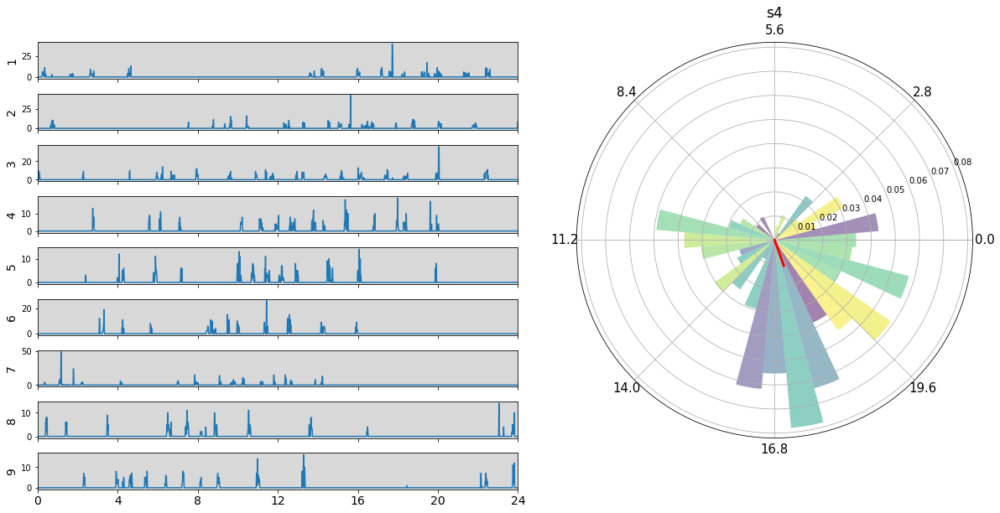

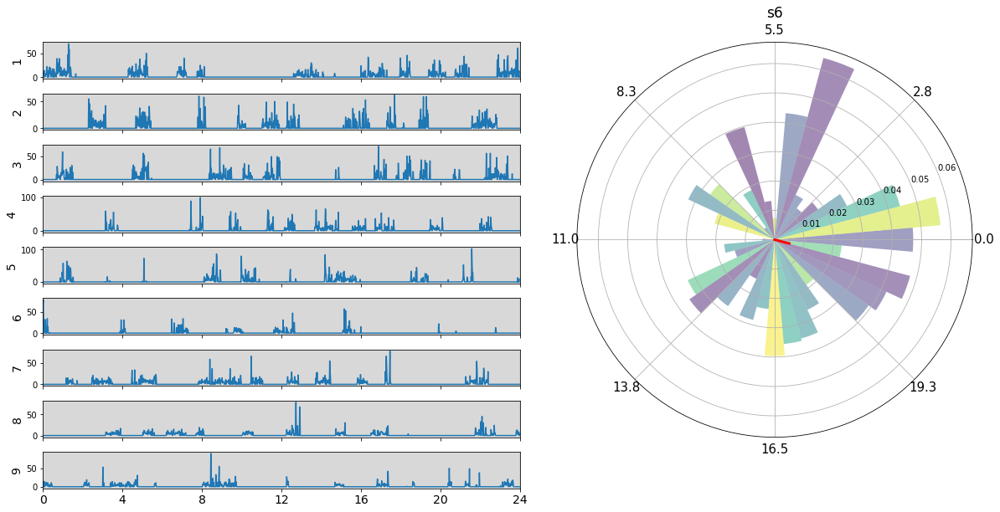

...

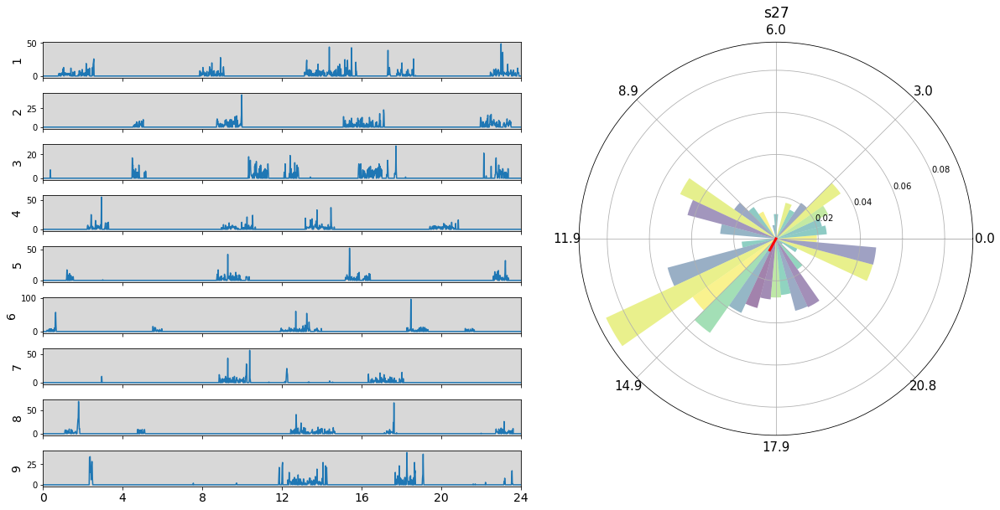

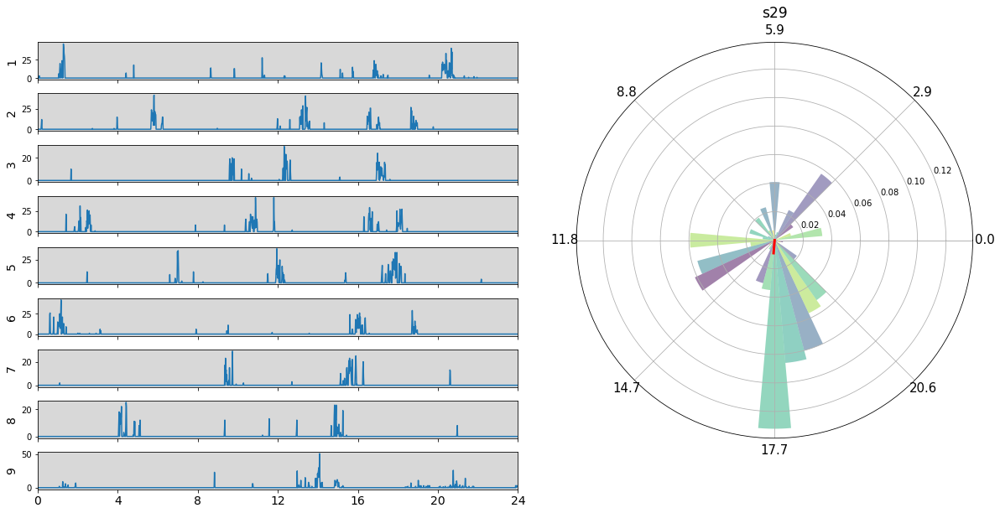

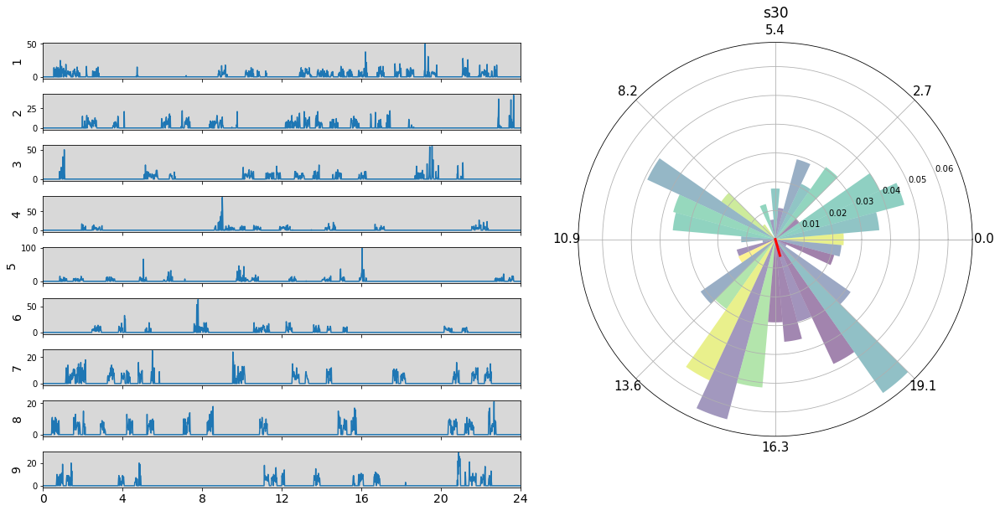

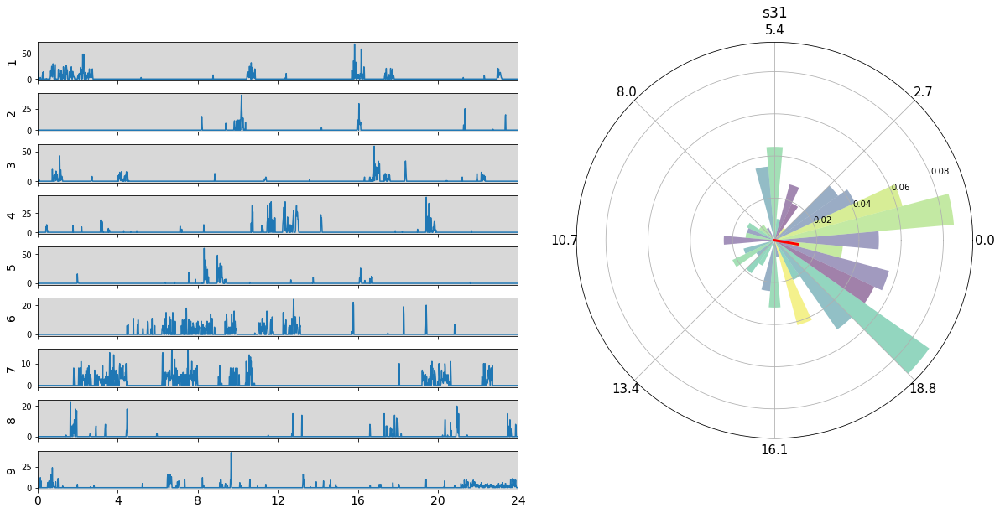

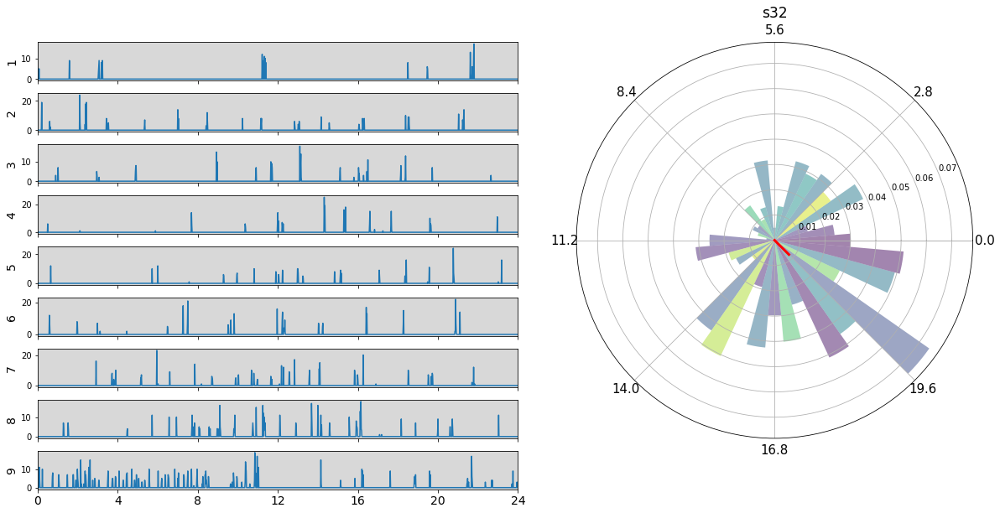

In [24]:
#md_dd: mean direction of each spider in DD period
#r_dd: r value of each spider in DD period
#periodlist: circadian period of each spider calculated by periodogram in DD period
md_dd=[]
r_dd=[]
periodlist=[]
for spider in s:
    #Only use spiders whose DD period calculated by periodogram is statistically significant at the level of 0.001
     if df_period.loc[spider, 'p value']<=0.001:
        period=df_period.loc[spider, 'Period']
        obj=Circular(nbins=36)
        #For DD, the circadian period is calculated by periodogram
        obj.run('Para_DD.csv', spider, period)
        obj.run_plot(spider)
        #Save the mean direction, r value, and circadian period in the lists
        md_dd.append(obj.theta_avg)
        r_dd.append(obj.r_total)
        periodlist.append(obj.period)

### Generate summary plots

Mean direction in DD period [-61.17957715968471, -77.20101608417185, -1.7523571341789208, -70.20185528884966, -14.414561209326235, -1.5809700640023496, -59.81271724102092, 11.981041522129745, 1.7863347421046947, -84.33812079470192, -46.06473168436911, -54.832656105387976, 42.069365257532674, -90.9208163169833, -75.58233097666657, -60.55909381301362, -150.07978720570964, -74.83531453799627, 3.455220024462817, -62.15954805476902, -62.02352427345547, -118.73228115476913, -94.74106804938678, -74.0349009949966, -9.825906066053244, -45.02156541101428]
R value in DD period [0.3613199683019029, 0.5186962644097305, 0.43646328131310946, 0.4038909564968651, 0.18425341690795372, 0.3339921004815036, 0.527223613604391, 0.31281827764022635, 0.2366349008918937, 0.27399315612462255, 0.39183127275250307, 0.2995875131838092, 0.18129798706513905, 0.37281183660848893, 0.18533393712062837, 0.2986049543617663, 0.3221169139963088, 0.5012796175455814, 0.21038346922331153, 0.44366839608993824, 0.336649786523799

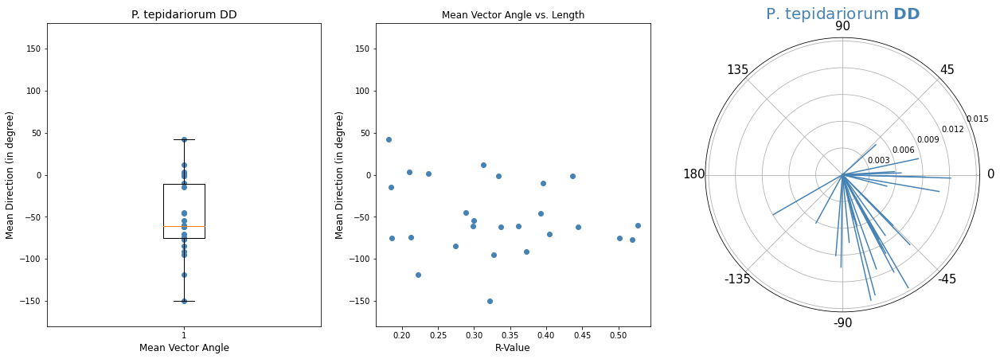

In [25]:
print('Mean direction in DD period', md_dd)
print('R value in DD period', r_dd)

x=np.ones(len(md_dd))
theta_radius_dd=[x*np.pi/180 for x in md_dd]
r_norm_dd=[x/36 for x in r_dd]

#Boxplot
plt.figure(figsize=(21, 7))
plt.subplot(131)
plt.title('P. tepidariorum DD', fontsize=14)
plt.boxplot(md_dd)
plt.scatter(x, md_dd, c='steelblue')
plt.ylim(-180, 180)
plt.ylabel('Mean Direction (in degree)', fontsize=12)
plt.xlabel('Mean Vector Angle', fontsize=12)

#Scatter plot
plt.subplot(132)
plt.title('Mean Vector Angle vs. Length')
plt.scatter(r_dd, md_dd, c='steelblue')
plt.ylim(-180, 180)
plt.xlabel('R-Value', fontsize=12)
plt.ylabel('Mean Direction (in degree)', fontsize=12)

#Circular plot for all spiders
ax=plt.subplot(133, projection='polar')
ax.set_xticks([0,np.pi/4, np.pi/2, 3*np.pi/4, np.pi, 5*np.pi/4, 3*np.pi/2, 7*np.pi/4])
ax.set_xticklabels([0,45,90,135,180,-135,-90,-45], fontsize=15)
plt.title('P. tepidariorum '+r"$\bf{" +'DD' + "}$", fontsize=20, c='steelblue')
for i in range(0, len(theta_radius_dd)):
    plt.plot([0, theta_radius_dd[i]], [0, r_norm_dd[i]], 'steelblue')
plt.yticks([0.003, 0.006, 0.009, 0.0120, 0.015])

#Save the figure
#plt.savefig('Parasteatoda tepidariorum DD')
plt.show()

In [17]:
#Save the mean direction and r value (mean length) in a dataframe
para_dd=pd.DataFrame({'Mean Direction': md_dd, 'Mean Length': r_dd}, index=df_rhythm[(df_rhythm['LD']==1) & (df_rhythm['DD']==1)].index)
#Save as a .csv file
para_dd.to_csv('Mean_Para_DD.csv')
para_dd.head()

,Mean Direction,Mean Length
s2,-38.244615,0.464385
s3,-74.982796,0.323647
s4,-36.022725,0.392791
s7,-1.580970,0.333992
s8,43.374269,0.377732


In [273]:
#Calculate the correlation between mean direction and r value (mean length)
dd=pd.DataFrame({'Mean Direction': md_dd, 'Mean Length': r_dd})
dd.corr()

,Mean Direction,Mean Length
Mean Direction,1.000000,-0.332061
Mean Length,-0.332061,1.000000


Slight negative correlation between mean direction and mean length.

## Compare LD and DD Period

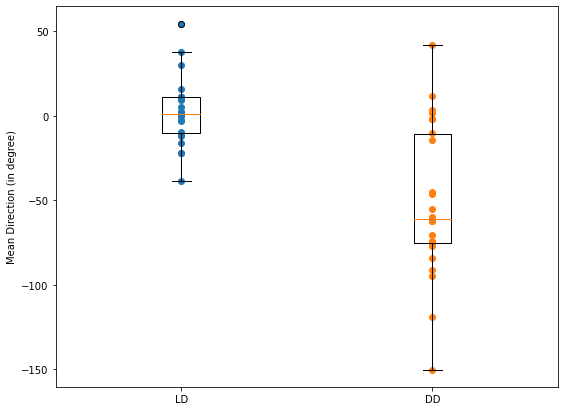

In [27]:
x1=np.ones(len(md_ld))
x2=[x+1 for x in x1]

#Generate boxplot to compare the distribution of mean direction in LD and DD period
plt.figure(figsize=(9, 7))
plt.boxplot([md_ld, md_dd], labels=['LD', 'DD'])
plt.scatter(x1, md_ld)
plt.scatter(x2, md_dd)
plt.ylabel('Mean Direction (in degree)')

plt.show()

## Rayleigh Test

We use Rayleigh Test to examine whether each spider has a preferred direction.

In [265]:
#Read in the data file
df_ld=pd.read_csv('Para_LD.csv', index_col=0)
df_dd=pd.read_csv('Para_DD.csv', index_col=0)
n1=len(df_ld)
n2=len(df_dd)

#z: z value of the Rayleigh test
#Null_hyp: the result of null hypothesis with the result of Rayleigh's test
#z_critical: threshold for null hypothesis got from the critical z values table
z=[]
Null_hyp=[]
z_critical=2.975

for r in r_dd:
    z_value=n2*r*r
    z.append(z_value)
    #Judge the result of Rayleigh's test
    if z_value<z_critical:
        Null_hyp.append('No')
    else:
        Null_hyp.append('Yes')

data=pd.DataFrame(index=df_rhythm[(df_rhythm['LD']==1) & (df_rhythm['DD']==1)].index)
data['DD Z Value']=z
data['DD Null Hypothesis']=Null_hyp
data

,LD Z Value,LD Null Hypothesis,DD Z Value,DD Null Hypothesis
s2,6567.285724,Yes,2794.871302,Yes
s3,3933.911729,Yes,1357.528795,Yes
s4,7658.318324,Yes,1999.529211,Yes
s7,7887.547310,Yes,1445.697372,Yes
s8,5871.415732,Yes,1849.151112,Yes
s10,5739.786408,Yes,479.797356,Yes
s14,7434.505251,Yes,1870.465787,Yes
s15,6151.874343,Yes,497.646306,Yes
s16,2545.983176,Yes,271.686997,Yes
s17,5242.437934,Yes,1606.938103,Yes


## Test Rayleigh Test

Use randomly generated data to test the performance of Rayleigh Test.

In [269]:
#Uniformly distributed
ran=2*np.pi*np.random.rand(11520)
X=np.cos(ran).sum()/len(ran)
Y=np.sin(ran).sum()/len(ran)
r=np.sqrt(X**2+Y**2)
z=len(ran)*r*r
r, z

(0.01038346254731222, 1.2420437123109376)

In [266]:
#Normally distributed
ran=np.random.normal(0, 0.1, 11520)
#plt.hist(ran)
#plt.show()
X=np.cos(ran).sum()/len(ran)
Y=np.sin(ran).sum()/len(ran)
r=np.sqrt(X**2+Y**2)
z=len(ran)*r*r
r, z

0.9950548925974554


(0.9950548925974554, 11406.346436530177)

If the data is unifomly distributed, the mean length (r value) and the z score are both very small while if the data is normally distributed, the mean length (r value) is close to1 and the z score are much bigger. This shows that the Rayleigh Test does work in this case.

## T-Test

We perform the t test to see if there is significant difference between the mean direction in LD and DD period or between mean direction and mean length.

In [281]:
stats.levene(md_ld, md_dd)
stats.ttest_ind(md_ld, md_dd, equal_var=False)

Ttest_indResult(statistic=0.4223311841618863, pvalue=0.680577258406091)

Mean direction has no significant difference.

In [282]:
stats.levene(r_ld, r_dd)
stats.ttest_ind(r_ld, r_dd, equal_var=False)

Ttest_indResult(statistic=9.216119438899403, pvalue=5.330614923154264e-09)

Mean length (r) has significant difference.

In [285]:
stats.ttest_1samp(period, 24.0)

Ttest_1sampResult(statistic=-6.538499509199018, pvalue=4.200822784401826e-05)

Period between LD period--24 hours and DD period has significant difference.